Load required tools 'as' shorthands tools name for convenience.

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import glob
import bbknn

The following lines can change your output errors or warning, useful for diagnostics. 

In all these commands, if you want to know what each code means (explaination), click at the open parenthesis. It will highlight as light green, then press "Shift+TAB" to see all options (rules) & explanation available for that command, then click + (or ^) to see more explanation.

* Verbosity(), 0 = errors, 1 = warnings, 2 = info, 3 = hints
* Use sc.logging.print_header() to show versions of packages that you are currently used in your environment
* For sc.settings.set_figure_params(dpi=xx) - change dpi to adjust resulation of your figure

In [2]:
sc.settings.verbosity = 3   
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80)

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.3 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.2


Loading the data file or previously saved file as 'adata'. 
Does not have to be called adata can be named anything that makes sense to you.
Very important if you have multiple dataset.
If reading from .h5ad file, use Estrus_untouched = sc.read('./Estrus_untouched.h5ad') 

In [3]:
Estrus_untouched = sc.read_loom('./Estrus.loom')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


The following line is unnecessary if using 'gene_ids'

In [4]:
Estrus_untouched.var_names_make_unique()  

Running 'Estrus_untouched' by itself will report out current data inside data file.

In [5]:
Estrus_untouched

AnnData object with n_obs × n_vars = 6573 × 27998
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

Loads highest expression genes in your cells before normalization and scaling.
This shows how many cells (%) in the dataset express these genes (highest expressing genes)

normalizing counts per cell
    finished (0:00:00)


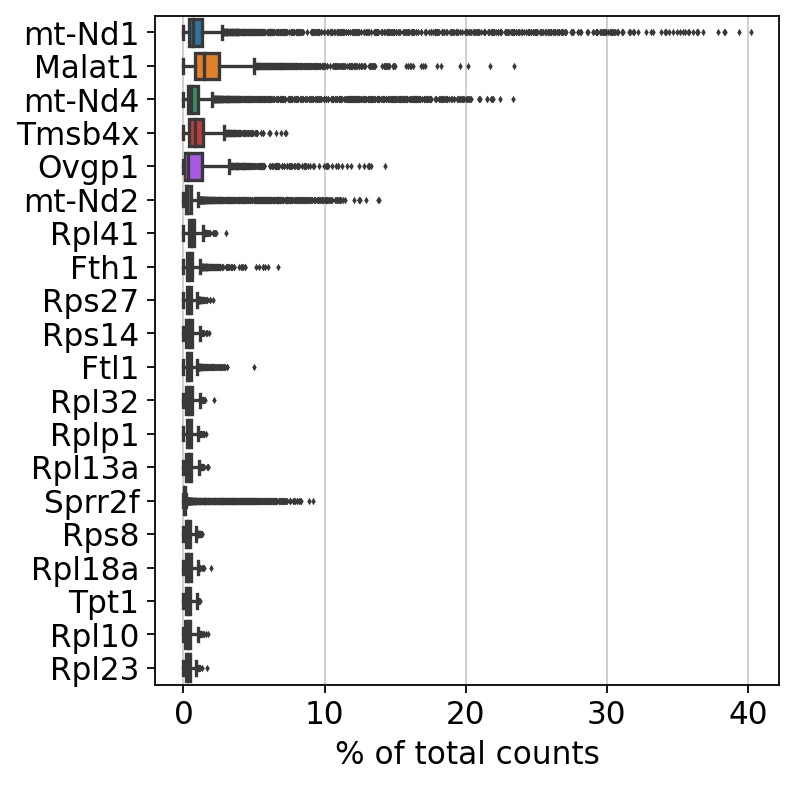

In [6]:
sc.pl.highest_expr_genes(Estrus_untouched, n_top=20)

Basic filtering for removing cells that are expressing less than 200 genes and genes that are expressed in less than 3 cells.

In [7]:
sc.pp.filter_cells(Estrus_untouched, min_genes=200) 
sc.pp.filter_genes(Estrus_untouched, min_cells=3)

filtered out 207 cells that have less than 200 genes expressed
filtered out 10134 genes that are detected in less than 3 cells


* Create mito_genes into Estrus_untouched to calculate percent mitochondrial genes in each cell.
* Compute fraction of counts in mito genes vs. all genes
* 'mt' here is lower case, because it's mice. In the tutorial is 'MT' because of human dataset. 
* The `.A1` is only necessary as X is sparse (to transform to a dense array after summing) puts the percentages of each cell into an array instead of an individual sparse
* Add the total counts per cell as observations-annotation (metadata) to adata.

In [8]:
mito_genes = Estrus_untouched.var_names.str.startswith('mt') 
Estrus_untouched.obs['percent_mito'] = np.sum(
    Estrus_untouched[:, mito_genes].X, axis=1).A1 / np.sum(Estrus_untouched.X, axis=1).A1 
Estrus_untouched.obs['n_counts'] = Estrus_untouched.X.sum(axis=1).A1 

If listing multiple data to present they must be in '[]' brackets.
* n_genes = how many genes are expressed in each cell
* n_counts = UMI for each cells
* percent_mito = should be less than 5-15%

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical
/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


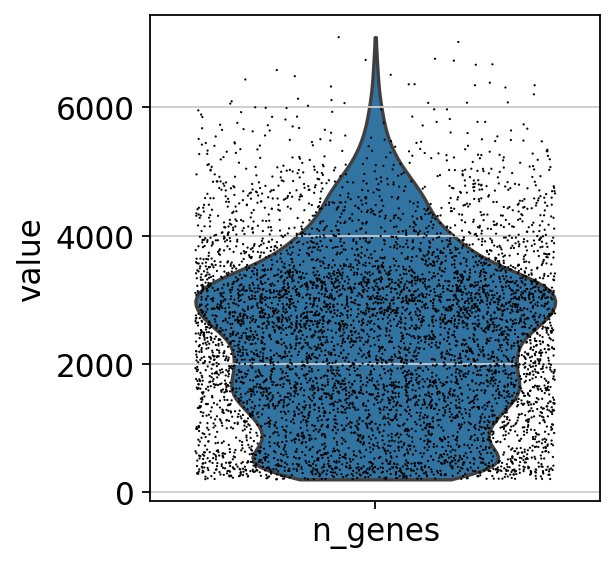

/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


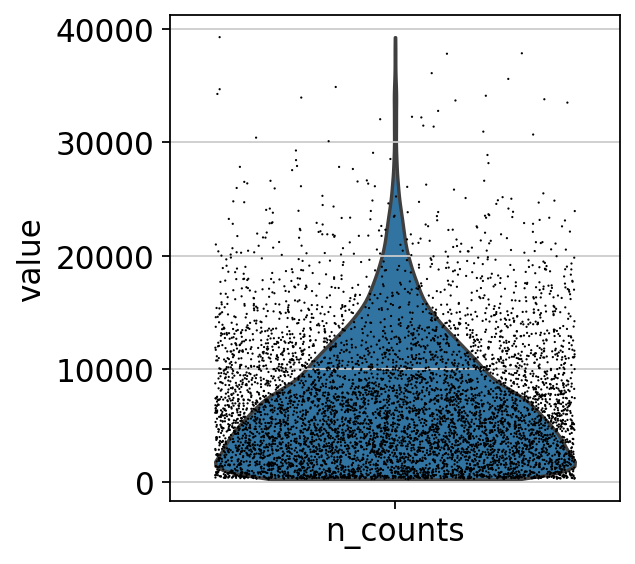

/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


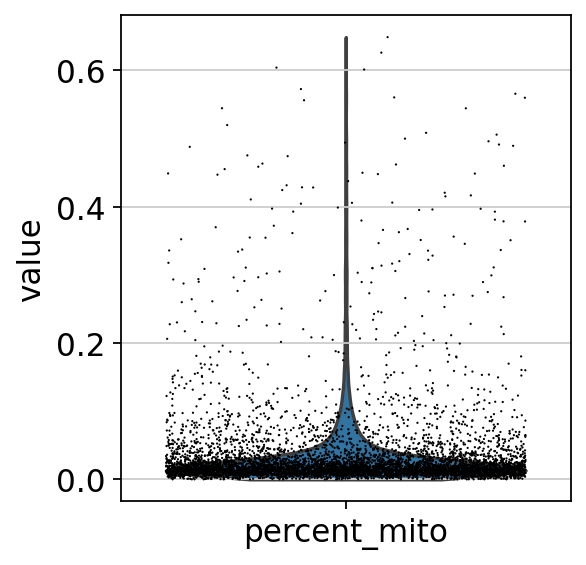

In [9]:
sc.pl.violin(Estrus_untouched, ['n_genes'], jitter=0.4)
sc.pl.violin(Estrus_untouched, ['n_counts'], jitter=0.4)
sc.pl.violin(Estrus_untouched, ['percent_mito'], jitter=0.4)

A different plot to show same data, usually more useful to adjust cutoff

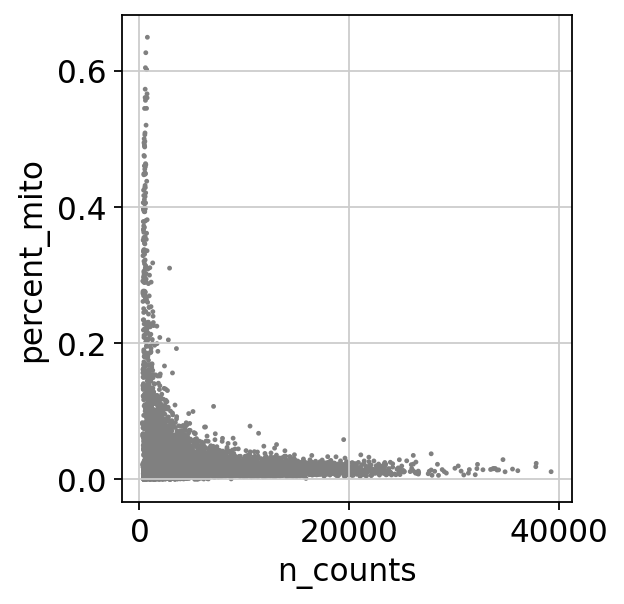

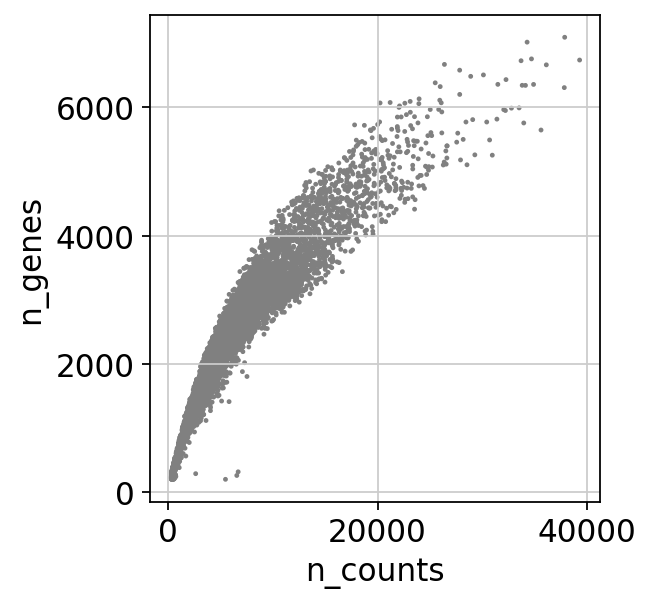

In [10]:
sc.pl.scatter(Estrus_untouched, x='n_counts', y='percent_mito')
sc.pl.scatter(Estrus_untouched, x='n_counts', y='n_genes')

Filtering data, usually cells with high gene count that are separated from the dataset are considered doublets.
i.e. >6000 n_genes could be doublets. Cells with high percent mito genes expression usually indicates that those cells are undergoing apoptosis. Usual range 5-15% to remove.

In [11]:
Estrus_untouched = Estrus_untouched[Estrus_untouched.obs.n_genes < 6000, :]
Estrus_untouched = Estrus_untouched[Estrus_untouched.obs.percent_mito < 0.05, :]

n_Count cell normalization makes it so that the gene expression in each cell doesn't overpower the expression of lesser expressed genes. If target_sum = None then the medium of n_counts/reads per cell is assigned to all cells to have counts comparable among all cells 

In [12]:
sc.pp.normalize_total(Estrus_untouched, target_sum = None)

normalizing counts per cell
    finished (0:00:00)


/opt/conda/envs/hub_v2/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Logarithmize the data matrix. Makes it easier to visualize data.

In [13]:
sc.pp.log1p(Estrus_untouched)

Regressing out total counts per cell and percent.mt before scaling. Take out mitochondrial genes before scaling (analyzing) the data because mt_genes shouldn't be accounted for cell population analysis.

In [14]:
sc.pp.regress_out(Estrus_untouched, ['n_counts', 'percent_mito']) 

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:01:12)


Computes and extracts highly variable genes. High 'n_top_genes' is useful when running RNA Velocity.

In [15]:
sc.pp.highly_variable_genes(Estrus_untouched, n_top_genes=5000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Plots highly variable genes

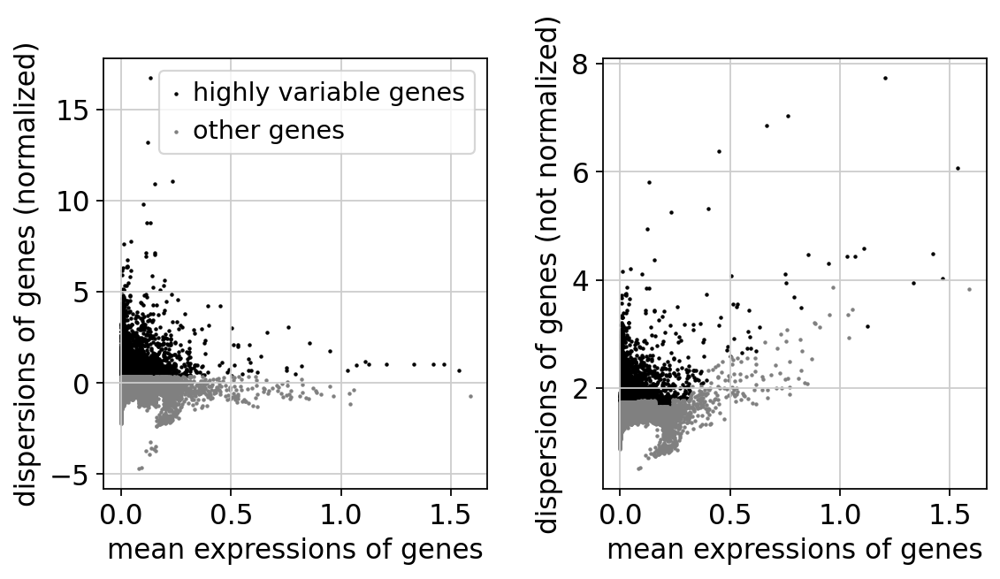

In [16]:
sc.pl.highly_variable_genes(Estrus_untouched)

Scaling = takes all your genes and makes sure that they do not overpower other genes in all cells. 'max_volume' is set to 10 to follow Seurats vignette

In [17]:
sc.pp.scale(Estrus_untouched, max_value=10) 

Compute pca, arpack is default but more options exist if wanted. 'arpack' is the most latest version for algorithm used for PCA

In [18]:
sc.tl.pca(Estrus_untouched, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


Plot PCA plot, 'color' can display observation or genes.

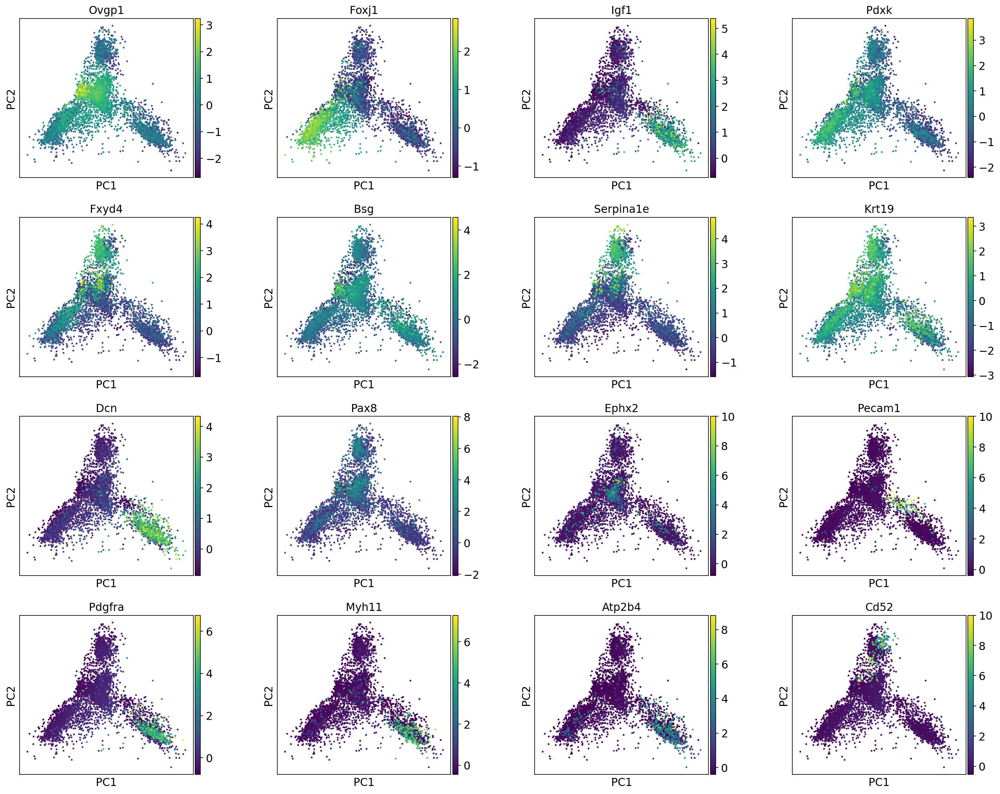

In [19]:
sc.pl.pca(Estrus_untouched, wspace=0.35,
          color=['Ovgp1', 'Foxj1', 'Igf1', 'Pdxk', 
                  'Fxyd4', 'Bsg', 'Serpina1e', 'Krt19', 'Dcn', 'Pax8',
                  'Ephx2', 'Pecam1', 'Pdgfra', 'Myh11', 'Atp2b4', 'Cd52'])

Compute and display principle components (PCs) in an elbow plot. Once the PCs reach close to linear PCs are considered not statistically significant and reduced compute time.

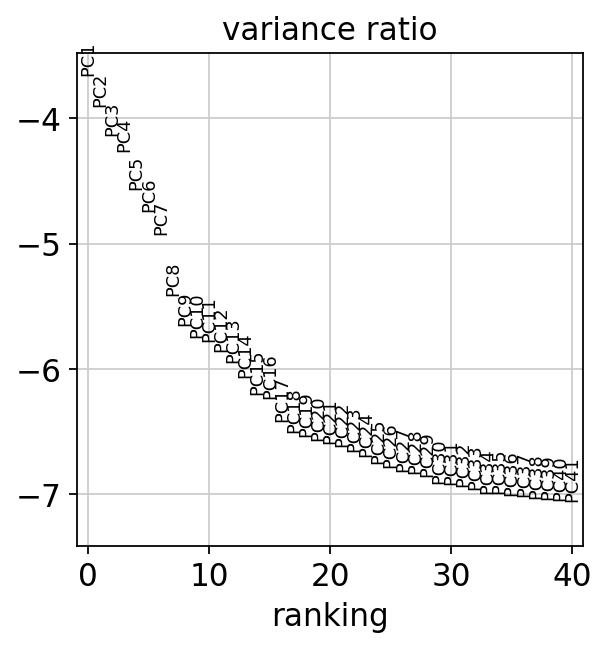

In [20]:
sc.pl.pca_variance_ratio(Estrus_untouched, n_pcs=40, log=True)

In [21]:
Estrus_untouched

AnnData object with n_obs × n_vars = 5440 × 17864
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'percent_mito', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

Computes cells neighbors graph. 'n_neighbors' set to 10 following Seurat Vignette. 'n_pcs' set to 37 based on elbow plot.

In [22]:
sc.pp.neighbors(Estrus_untouched, n_neighbors=10, n_pcs=37)

computing neighbors
    using 'X_pca' with n_pcs = 37
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


Compute UMAP based on neighbors and PCs

In [23]:
sc.tl.umap(Estrus_untouched)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


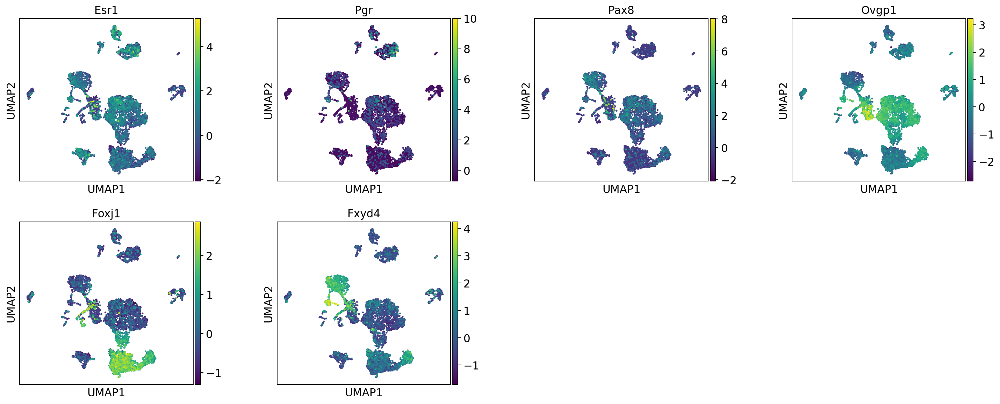

In [24]:
sc.pl.umap(Estrus_untouched, wspace=0.35,
           color=['Esr1', 'Pgr', 'Pax8', 'Ovgp1', 'Foxj1', 'Fxyd4'])

Clustering based on leiden instead of louvain. Leiden is more updated. Resolution is adjusted based on background knowledge of the cells your working on. Increasing resolution increases how many clusters are identified. More useful tips for adjusting resolution [here](https://nbisweden.github.io/workshop-scRNAseq/labs/compiled/scanpy/scanpy_04_clustering.html)

In [25]:
sc.tl.leiden(Estrus_untouched, resolution=0.1) 

running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


Plotting leiden UMAP to show cell clusters and correlating to known markers of cell types.
This is not an actual cell population yet because it still gives out two Ovgp1 populations and two Foxj1 populations. Based on this [paper](https://www.nature.com/articles/s41598-019-40923-w), here are the markers for each cell type:
* epithelial cells: *Epcam* and *Cdh1*
* endothelial cells: *Pecam1* and *Emcn*
* stromal cells: *Pdgfra, Dcn, Col15a1, Twist2*
* myocytes: *Mef2a* and *Pdlim3*
* lymphocytes: *Cd52* and *Ptprc*
* striated muscle bands: *Mybpc1, Dkk2, Slitrk6*, and *Dio2* (*Myo1*)
* smooth muscle: *Tes*, *Smoc2* (smooth muscle associated protein), *Dab1*, and *Camk1d* (*Myo2*)
* myeloid cells: *Lyz2, Pf4, C1q*
* pericytes: *Rgs5* and *Cspg4*
* mesothelial cells: *Upk3b* and *Lrrn4*

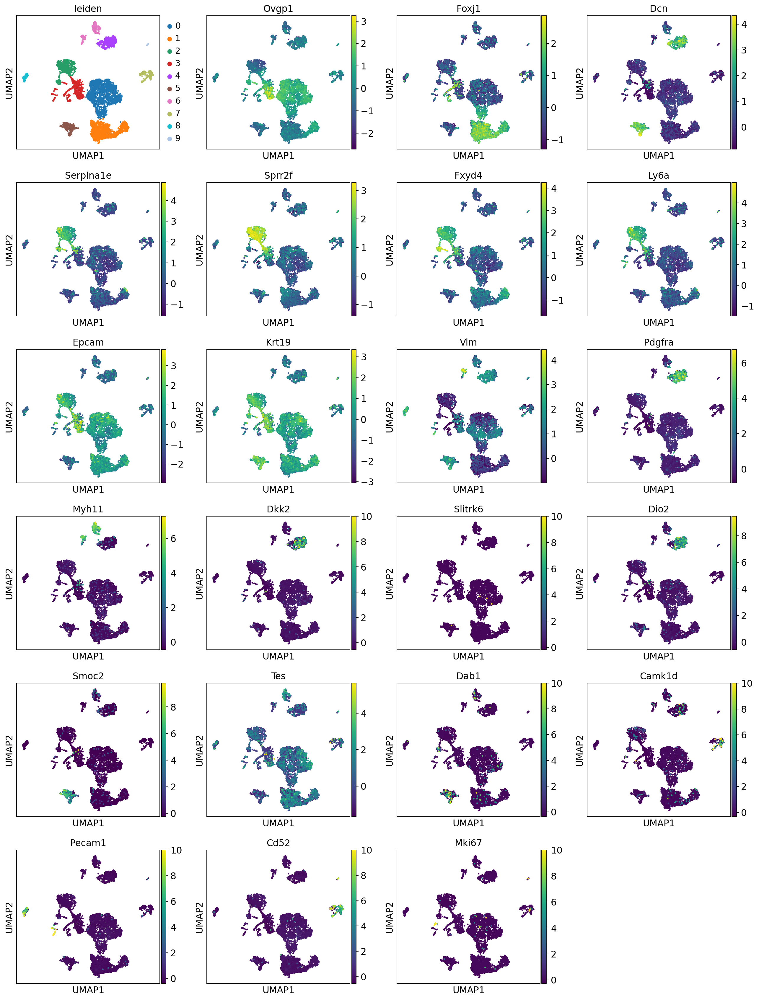

In [26]:
sc.pl.umap(Estrus_untouched,
           color=['leiden', 'Ovgp1', 'Foxj1', 'Dcn', 'Serpina1e', 'Sprr2f',
                  'Fxyd4', 'Ly6a', 'Epcam', 'Krt19', 'Vim', 'Pdgfra', 'Myh11', 
                  'Dkk2', 'Slitrk6', 'Dio2', 'Smoc2', 'Tes', 'Dab1', 'Camk1d', 'Pecam1', 'Cd52','Mki67'])

Removing stromal and immune cells into a new adata called 'adata_subset'. 
**PUT THE ONE YOU WANT TO KEEP HERE.

In [27]:
Estrus_subset = Estrus_untouched[Estrus_untouched.obs['leiden'].isin(
    ['0', '1', '2', '3', '4', '5', '6'])]

Rerun UMAP to verifying that cells were removed

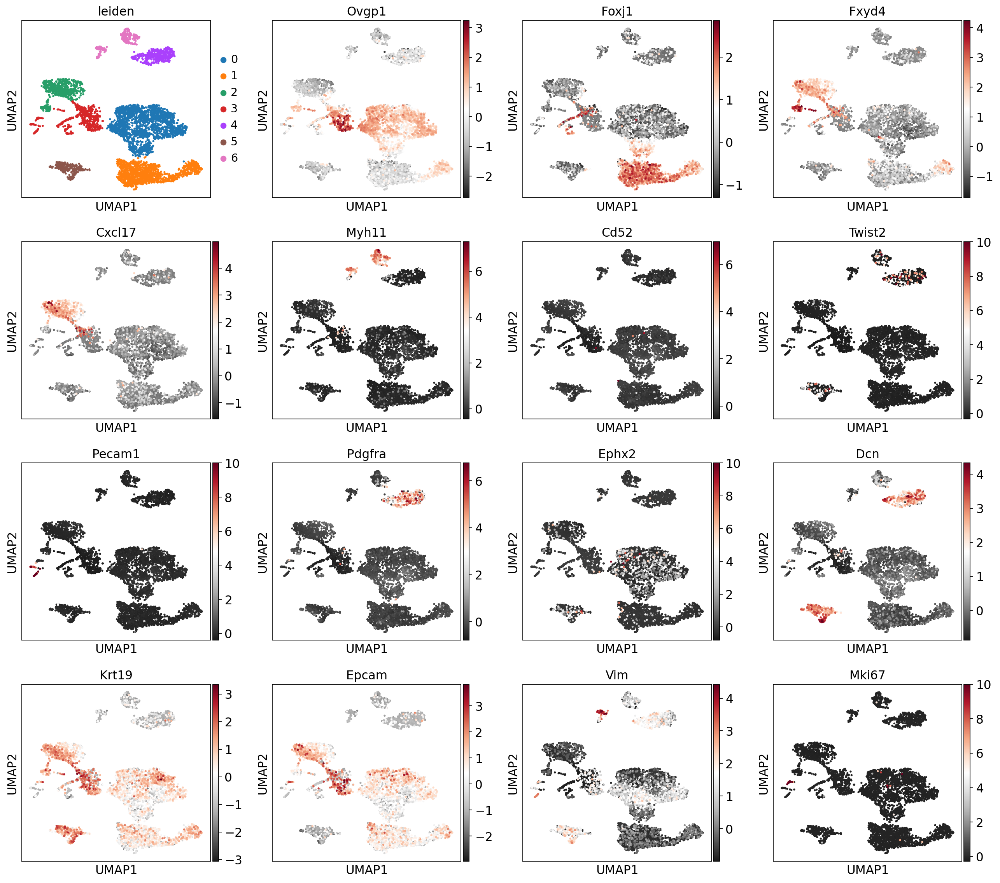

In [28]:
sc.pl.umap(Estrus_subset, 
           color_map='RdGy_r',
           color=['leiden', 'Ovgp1', 'Foxj1', 'Fxyd4', 'Cxcl17', 'Myh11', 'Cd52', 'Twist2', 'Pecam1',
                 'Pdgfra', 'Ephx2', 'Dcn', 'Krt19', 'Epcam', 'Vim','Mki67'])

Rerun dataset, now you will see that 'neighbors', 'umap', 'leiden', 'leiden_colors' are added in this dataset

In [29]:
Estrus_subset

View of AnnData object with n_obs × n_vars = 5156 × 17864
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

Saving data file to 'results_file'. 
* To safe file into this current directory, it has to be './file_name.h5ad'

In [30]:
Estrus_subset.write('./Estrus_subset.h5ad')

Below, you will have to rerun the pipeline with Estrus_subset (after removal of Cd52, and Pecam1 cells). This is because PCA, neighbors, and umap are dependent on all current cells and because I removed unwanted cells I have to re-run those commands.

In [31]:
sc.tl.pca(Estrus_subset, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


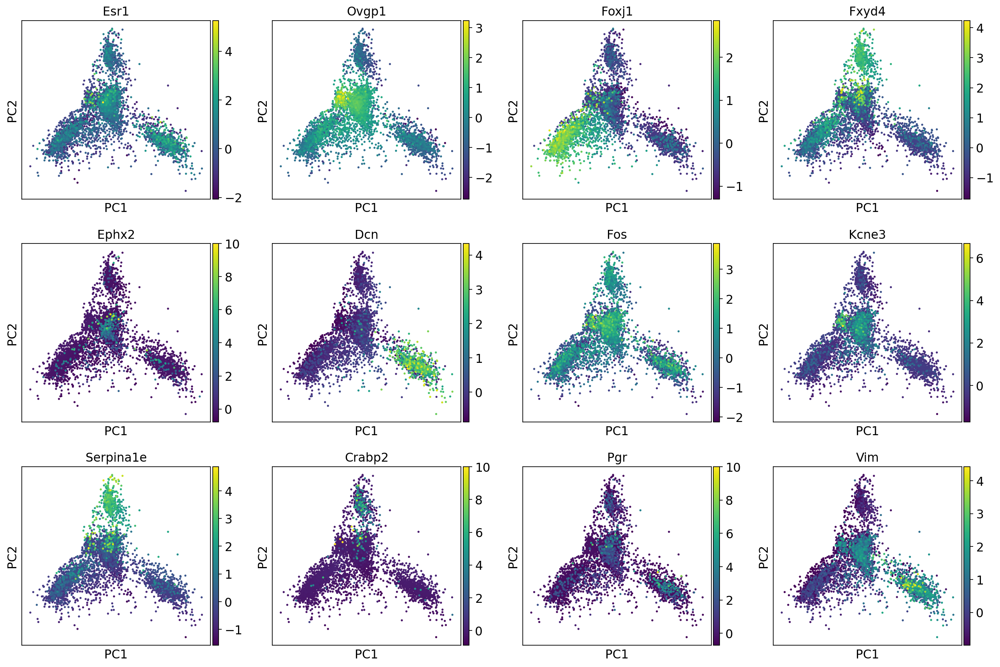

In [32]:
sc.pl.pca(Estrus_subset,
          color=['Esr1', 'Ovgp1', 'Foxj1', 'Fxyd4', 'Ephx2', 'Dcn', 'Fos', 'Kcne3', 'Serpina1e', 'Crabp2', 'Pgr', 'Vim'])

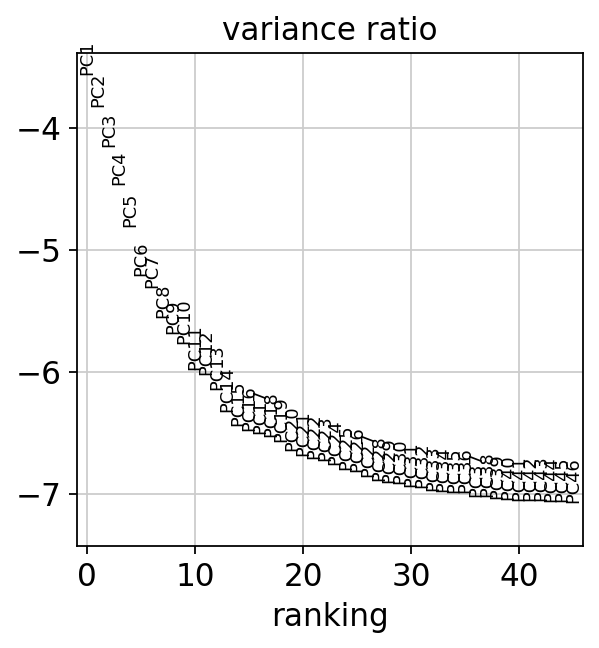

In [33]:
sc.pl.pca_variance_ratio(Estrus_subset, n_pcs=45, log=True)

In [34]:
sc.pp.neighbors(Estrus_subset, n_neighbors=10, n_pcs=37)

computing neighbors
    using 'X_pca' with n_pcs = 37
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [35]:
sc.tl.umap(Estrus_subset)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


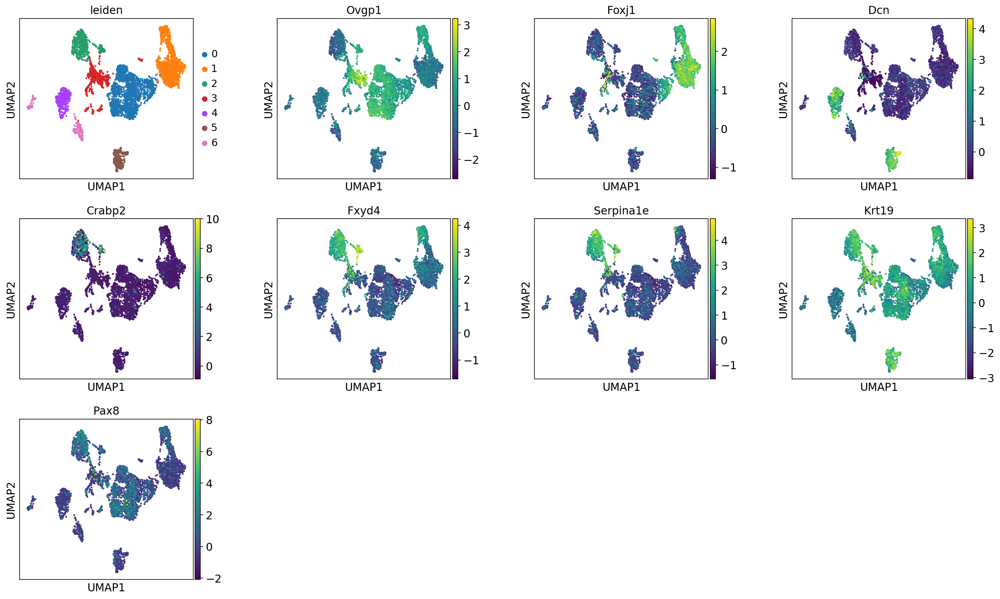

In [36]:
sc.pl.umap(Estrus_subset, wspace=0.35,
           color=['leiden', 'Ovgp1', 'Foxj1', 'Dcn', 'Crabp2', 'Fxyd4', 'Serpina1e', 'Krt19', 'Pax8'])

Reduced resolution based on background knowledge on cells, in this case, we can look at the *Foxj1*+ cells - they shouldn't be more than one *Foxj1*+ cell population.

In [37]:
sc.tl.leiden(Estrus_subset, resolution=0.09)

running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


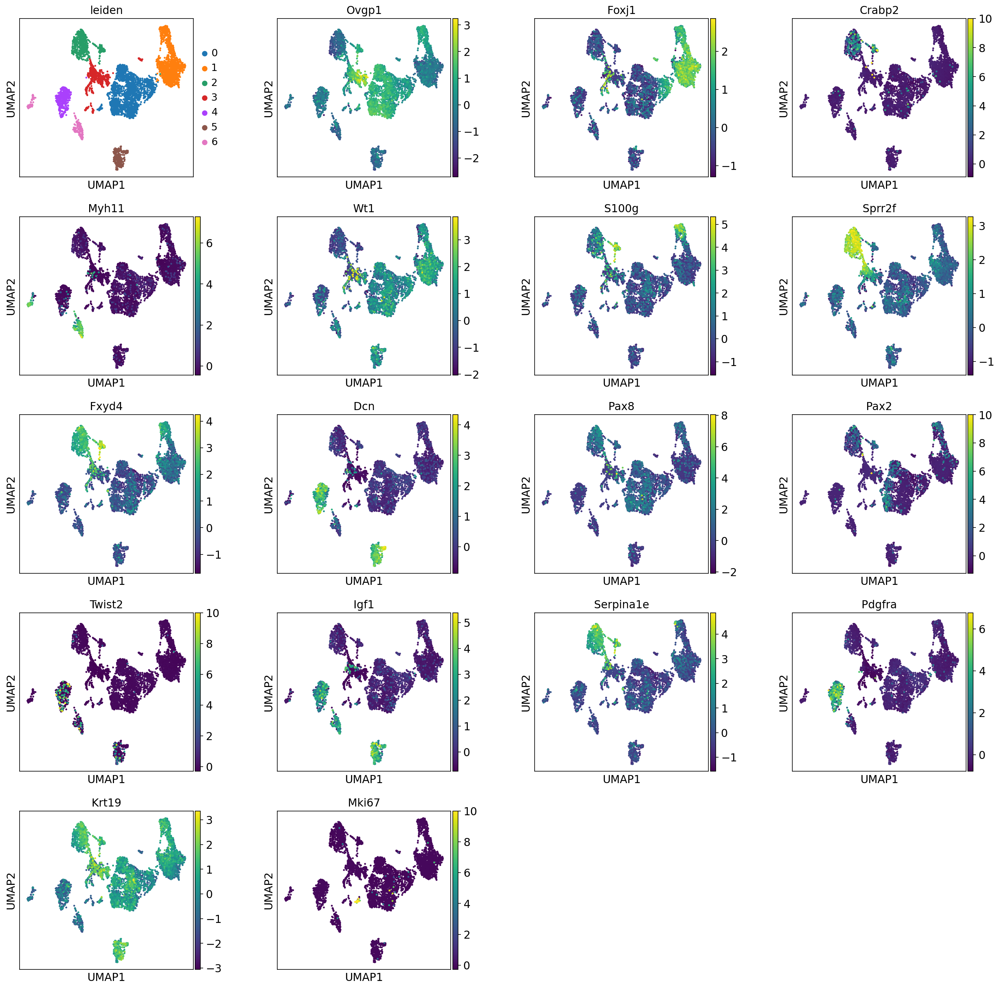

In [38]:
sc.pl.umap(Estrus_subset, wspace=0.35, 
           color=['leiden', 'Ovgp1', 'Foxj1', 'Crabp2', 'Myh11', 'Wt1', 'S100g', 'Sprr2f',
                  'Fxyd4', 'Dcn', 'Pax8', 'Pax2', 'Twist2', 'Igf1', 'Serpina1e', 'Pdgfra', 'Krt19', 'Mki67'])

Saving once more before [bbknn](https://github.com/Teichlab/bbknn) - we are not doing bbknn in this dataset, but it's good to save data anyway.

In [39]:
Estrus_subset.write('./Estrus_subset.h5ad')

In [40]:
marker_genes = ['Epcam', 'Krt15','Krt8','Krt19','Vim','Pdgfra','Twist2', 'Sprr2f', 'Fxyd4', 'Igfbp6',
                'Acta2', 'Myh11','Foxj1','Ovgp1','Wt1','Serpina1e','S100g','Pecam1',
                 ]

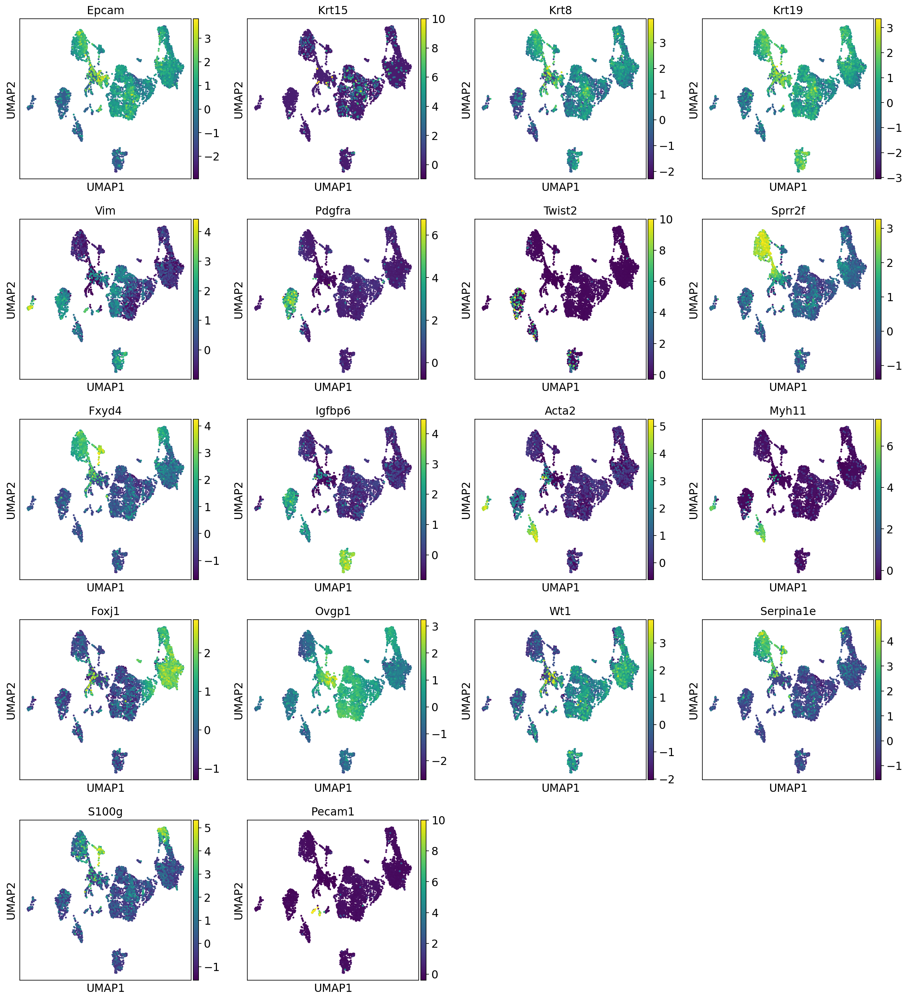

In [41]:
sc.pl.umap(Estrus_subset, color=marker_genes)

Now you can rename your category as 'new_cluster_names'

In [42]:
new_cluster_names = [
    '0 Secretory_InfAmp',
    '1 Ciliated_InfAmp',
    '2 Secretory_IsthUTJ',
    '3 Epithelial_subset',
    '4 Fibroblast Pdgfra+',
    '5 Fibroblast Pdgfra-',
    '6 Muscle'
]
Estrus_subset.rename_categories('leiden', new_cluster_names)

Now changing the color for each cluster if needed.
* multiple color pallettes to choose from [here](https://matplotlib.org/tutorials/colors/colormaps.html)

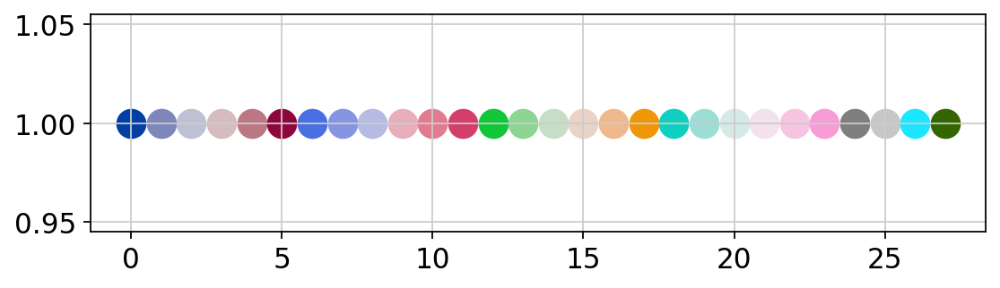

In [43]:
plt.figure(figsize=(8, 2))
for i in range(28):
    plt.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
plt.show()

In [44]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(Estrus_subset.uns['leiden_colors'])

To be consistent with the OVX_Veh/E2 dataset population:
* new_colors[[0]] = zeileis_colors[[23]]  #0 Ciliated_InfAmp
* new_colors[[1]] = zeileis_colors[[6]]  #1 Secretory_InfAmp
* new_colors[[2]] = zeileis_colors[[13]]  #2 Secretory_IsthUTJ
* new_colors[[3]] = zeileis_colors[[15]]  #3 Fibroblast Twist2+
* new_colors[[4]] = zeileis_colors[[24]]  #4 Muscle
* new_colors[[5]] = zeileis_colors[[5]]  #5 Epithelial_subset
* new_colors[[6]] = zeileis_colors[[17]]  #6 Fibroblast Pdgfra+
***
Estrus dataset populations:
*    '0 Secretory_InfAmp',
*    '1 Ciliated_InfAmp',
*    '2 Secretory_IsthUTJ',
*    '3 Epithelial_subset',
*    '4 Fibroblast Pdgfra+',
*    '5 Fibroblast Pdgfra-',
*    '6 Muscle'

In [45]:
new_colors[[0]] = zeileis_colors[[6]]  #0 Secretory_InfAmp
new_colors[[1]] = zeileis_colors[[23]]  #1 Ciliated_InfAmp
new_colors[[2]] = zeileis_colors[[13]]  #2 Secretory_IsthUTJ
new_colors[[3]] = zeileis_colors[[5]]  #3 Epithelial_subset
new_colors[[4]] = zeileis_colors[[16]]  #4 Fibroblast Pdgfra+
new_colors[[5]] = zeileis_colors[[17]]  #5 Fibroblast Pdgfra-
new_colors[[6]] = zeileis_colors[[24]]  #6 Muscle

In [46]:
Estrus_subset.uns['leiden_colors'] = new_colors

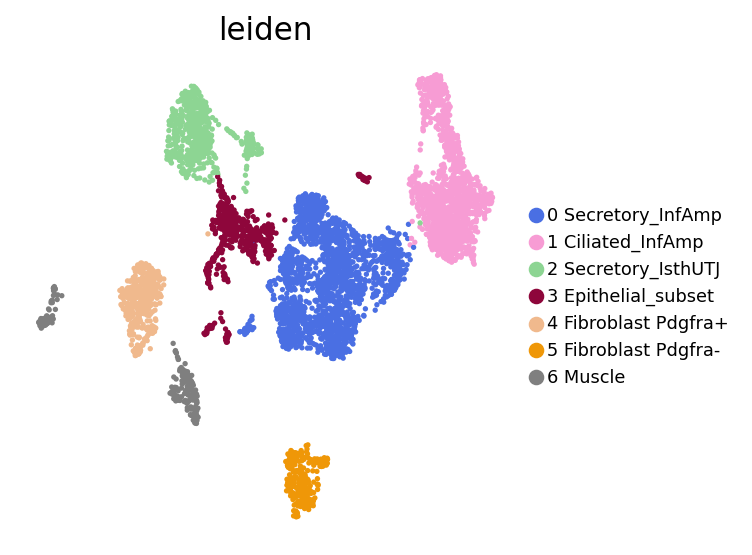

In [47]:
sc.pl.umap(Estrus_subset, color='leiden', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False, 
          save='_Estrus_Leiden.pdf')

To display # of cell in each cluster

In [48]:
Estrus_subset.obs.groupby(["leiden"]).apply(len)

leiden
0 Secretory_InfAmp      1895
1 Ciliated_InfAmp       1274
2 Secretory_IsthUTJ      582
3 Epithelial_subset      493
4 Fibroblast Pdgfra+     422
5 Fibroblast Pdgfra-     259
6 Muscle                 231
dtype: int64

To plot dotplot based on marker_genes indicated in steps above.
* color_map can be chosen from [here](https://matplotlib.org/tutorials/colors/colormaps.html)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns["dendrogram_['leiden']"]`


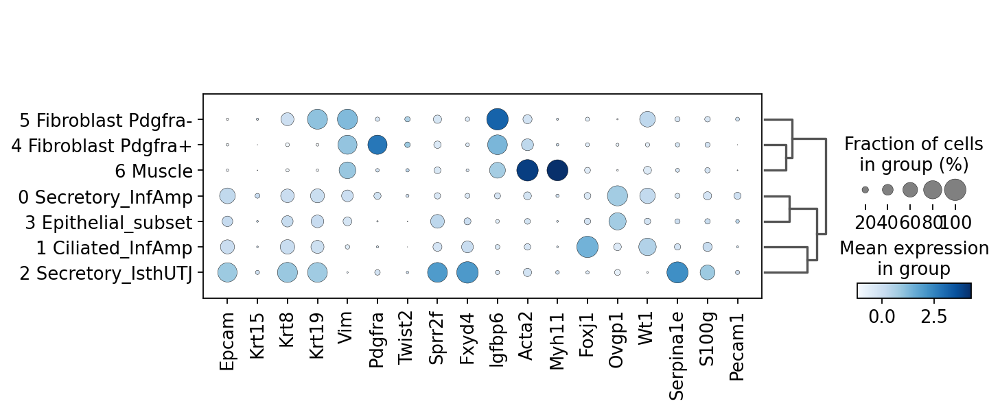

In [49]:
ax = sc.pl.dotplot(Estrus_subset, 
                   marker_genes, groupby='leiden', dendrogram=True, 
                   color_map='Blues',
                  save='_Estrus_subset_markergenes')

Computes and displays the differential genes for each cluster based on wilcoxon algorithm. You can adjust plot to display or DataFrame to display how many genes you want to show.
* Top genes = .head()
* Bottom genes = .tail()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


/opt/conda/envs/hub_v2/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


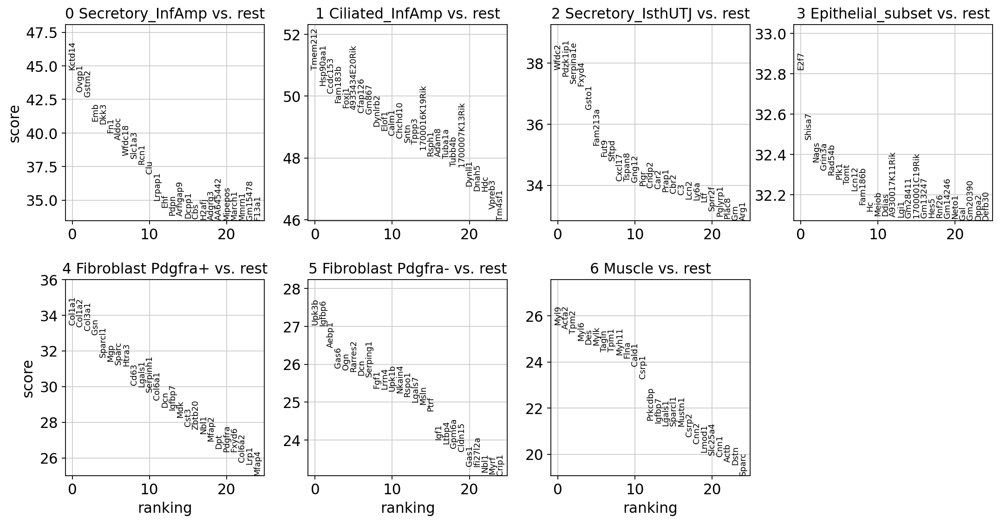

,0 Secretory_InfAmp,1 Ciliated_InfAmp,2 Secretory_IsthUTJ,3 Epithelial_subset,4 Fibroblast Pdgfra+,5 Fibroblast Pdgfra-,6 Muscle
0,Kctd14,Tmem212,Wfdc2,E2f7,Col1a1,Upk3b,Myl9
1,Ovgp1,Hsp90aa1,Pdzk1ip1,Shisa7,Col1a2,Igfbp6,Acta2
2,Gstm2,Ccdc153,Serpina1e,Nags,Col3a1,Aebp1,Tpm2
3,Emb,Fam183b,Fxyd4,Grin3a,Gsn,Gas6,Myl6
4,Dkk3,Foxj1,Gsto1,Rad54b,Sparcl1,Ogn,Des
5,Fn1,4933434E20Rik,Fam213a,Plk1,Mgp,Rarres2,Mylk
6,Aldoc,Cfap126,Fut9,Tomt,Sparc,Dcn,Tagln
7,Wfdc18,Gm867,Sftpd,Lcn12,Htra3,Serping1,Tpm1
8,Slc1a3,Dynlrb2,Cxcl17,Fam186b,Cd63,Fgf1,Myh11
9,Rcn1,Elof1,Tspan8,Hc,Lgals1,Lrrn4,Flna


In [50]:
sc.tl.rank_genes_groups(Estrus_subset, 'leiden', method='wilcoxon',n_genes=500)
sc.pl.rank_genes_groups(Estrus_subset, n_genes=25, sharey=False)
pd.DataFrame(Estrus_subset.uns['rank_genes_groups']['names']).head(10)

Display differential genes along with their p-values. If need to export full list - make sure to delete .head()
* If you want to look at bottom genes (doesn't mean that they are down-regulated genes), use 'tail' instead of 'Head' command

In [51]:
result = Estrus_subset.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(20)

,0 Secretory_InfAmp_n,0 Secretory_InfAmp_p,1 Ciliated_InfAmp_n,1 Ciliated_InfAmp_p,2 Secretory_IsthUTJ_n,2 Secretory_IsthUTJ_p,3 Epithelial_subset_n,3 Epithelial_subset_p,4 Fibroblast Pdgfra+_n,4 Fibroblast Pdgfra+_p,5 Fibroblast Pdgfra-_n,5 Fibroblast Pdgfra-_p,6 Muscle_n,6 Muscle_p
0,Kctd14,0.000000e+00,Tmem212,0.0,Wfdc2,0.000000e+00,E2f7,3.056074e-236,Col1a1,1.100948e-245,Upk3b,4.061292e-161,Myl9,8.806977e-145
1,Ovgp1,0.000000e+00,Hsp90aa1,0.0,Pdzk1ip1,4.991853e-309,Shisa7,2.314037e-231,Col1a2,4.225372e-244,Igfbp6,9.467776e-161,Acta2,8.388764e-143
2,Gstm2,0.000000e+00,Ccdc153,0.0,Serpina1e,2.887678e-305,Nags,8.932115e-230,Col3a1,4.729438e-241,Aebp1,3.757894e-154,Tpm2,1.739649e-140
3,Emb,0.000000e+00,Fam183b,0.0,Fxyd4,1.053041e-303,Grin3a,3.201974e-229,Gsn,1.311480e-237,Gas6,4.996182e-148,Myl6,3.974448e-137
4,Dkk3,0.000000e+00,Foxj1,0.0,Gsto1,1.302281e-291,Rad54b,7.670263e-229,Sparcl1,8.511427e-220,Ogn,2.304536e-147,Des,1.419504e-135
5,Fn1,0.000000e+00,4933434E20Rik,0.0,Fam213a,3.672580e-273,Plk1,1.411290e-228,Mgp,1.063516e-216,Rarres2,7.041291e-147,Mylk,5.108750e-135
6,Aldoc,0.000000e+00,Cfap126,0.0,Fut9,1.915211e-267,Tomt,3.220714e-228,Sparc,4.292334e-214,Dcn,9.501077e-146,Tagln,4.535945e-132
7,Wfdc18,0.000000e+00,Gm867,0.0,Sftpd,1.361998e-265,Lcn12,8.935710e-228,Htra3,4.045076e-213,Serping1,2.461977e-145,Tpm1,5.163588e-132
8,Slc1a3,0.000000e+00,Dynlrb2,0.0,Cxcl17,1.238027e-255,Fam186b,8.305075e-227,Cd63,7.950566e-199,Fgf1,6.233614e-142,Myh11,1.904002e-130
9,Rcn1,1.228064e-310,Elof1,0.0,Tspan8,2.290578e-255,Hc,2.443503e-226,Lgals1,1.374272e-197,Lrrn4,1.050698e-141,Flna,4.438518e-129


In [52]:
Df_Pvalue = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
for group in groups for key in ['names', 'pvals']})

Save genes and p-value into .cvs file

In [53]:
Df_Pvalue.to_csv('Df_Pvalue_estrus_leiden_rank_genes.csv')

Plot heatmap with a dendrogram. Groupby can be changed to observations for different heatmap.

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


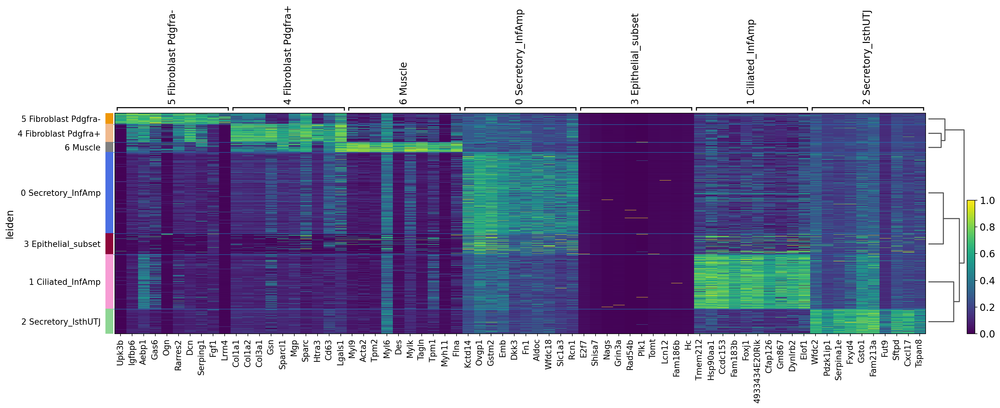

In [54]:
sc.pl.rank_genes_groups_heatmap(Estrus_subset, n_genes=10,
                                standard_scale='var',
                                groupby='leiden',
                                show_gene_labels=True, 
                               save='Fig 4B')

Displays current leiden catergories (clusters)

In [55]:
Estrus_subset.obs['leiden'].cat.categories

Index(['0 Secretory_InfAmp', '1 Ciliated_InfAmp', '2 Secretory_IsthUTJ',
       '3 Epithelial_subset', '4 Fibroblast Pdgfra+', '5 Fibroblast Pdgfra-',
       '6 Muscle'],
      dtype='object')

Annotating Leiden. This is important if you want consistency for subsequent analysis in the scvelo part. 
* Adding new leiden annotation with adjusted names
* i.e. Estrus_subset.obs['leiden_anno'].cat.categories = ['0 Secretory_InfAmp', '1 Ciliated_InfAmp', '2 Secretory_IsthUTJ', '3 Epithelial_subset', '4 Fibroblast Pdgfra+', '5 Fibroblast Pdgfra-', '6 Muscle']


In [56]:
Estrus_subset.obs['leiden_anno'] = Estrus_subset.obs['leiden']
Estrus_subset.obs['leiden_anno'].cat.categories = ['0 Secretory_InfAmp', '1 Ciliated_InfAmp', 
                                                    '2 Secretory_IsthUTJ', '3 Epithelial_subset', 
                                                    '4 Fibroblast Pdgfra+', '5 Fibroblast Pdgfra-', '6 Muscle']

Prints working directory 

In [57]:
!pwd

/home/scrna/data/Estrus


Plotting different genes for later data analysis from here on.
If plotting more than 1 gene, you can adjust the column by using ncol=

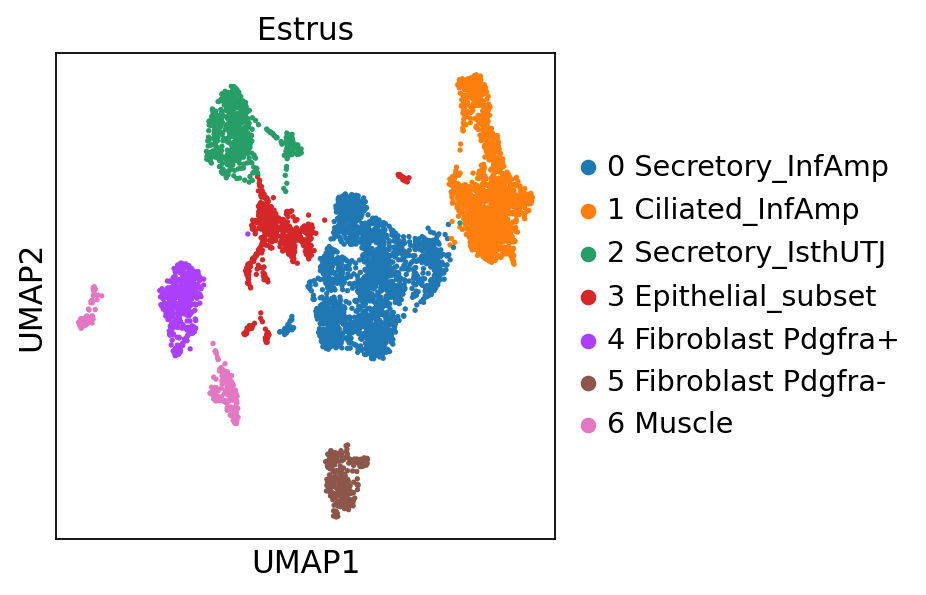

In [58]:
sc.pl.umap(Estrus_subset, wspace=0.45, 
           color=['leiden_anno'], title='Estrus')

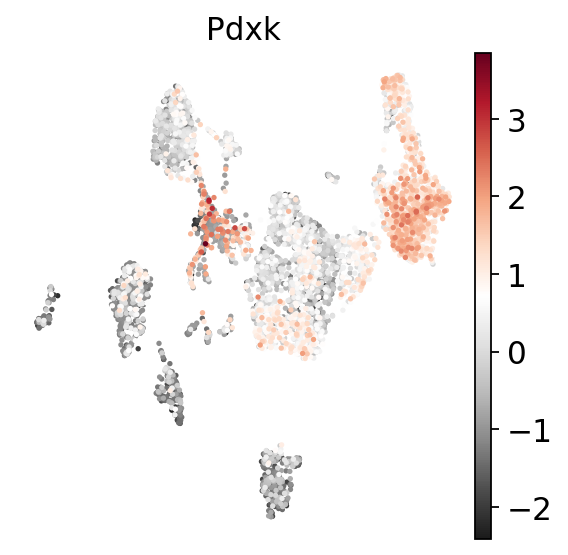

In [59]:
sc.pl.umap(Estrus_subset, wspace=0.35, legend_loc='on data', 
           color=['Pdxk'], color_map='RdGy_r', frameon=False,
           save='_Fig 4C.pdf')

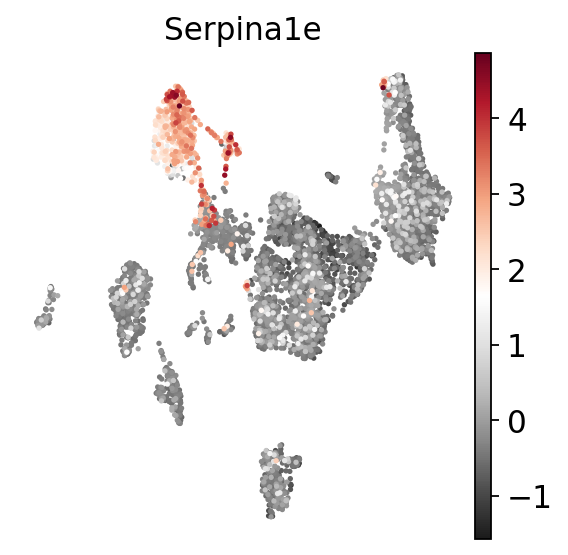

In [60]:
sc.pl.umap(Estrus_subset, wspace=0.35, legend_loc='on data', 
           color=['Serpina1e'], color_map='RdGy_r', frameon=False,
           save='_Fig 4D.pdf')

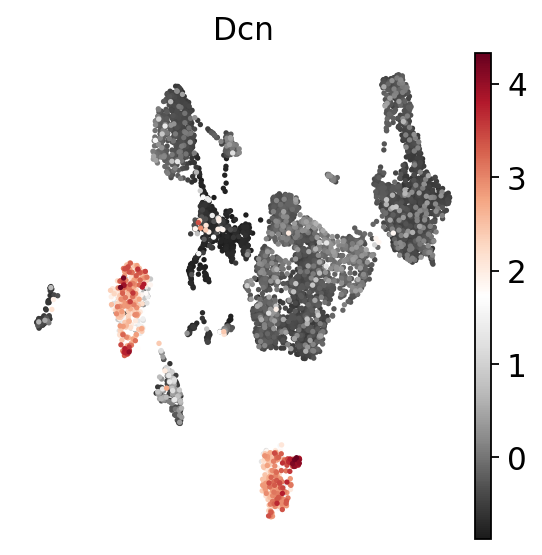

In [61]:
sc.pl.umap(Estrus_subset, wspace=0.35, legend_loc='on data', 
           color=['Dcn'], color_map='RdGy_r', frameon=False,
           save='_Fig 4E.pdf')

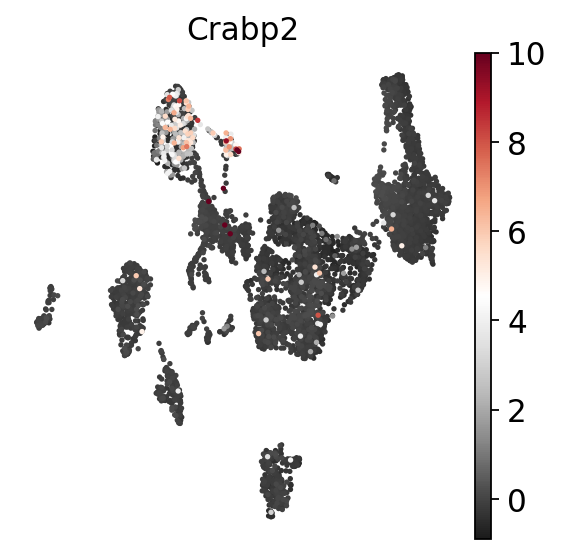

In [62]:
sc.pl.umap(Estrus_subset, wspace=0.35, legend_loc='on data', 
           color=['Crabp2'], color_map='RdGy_r', frameon=False,
           save='_Fig 4F.pdf')

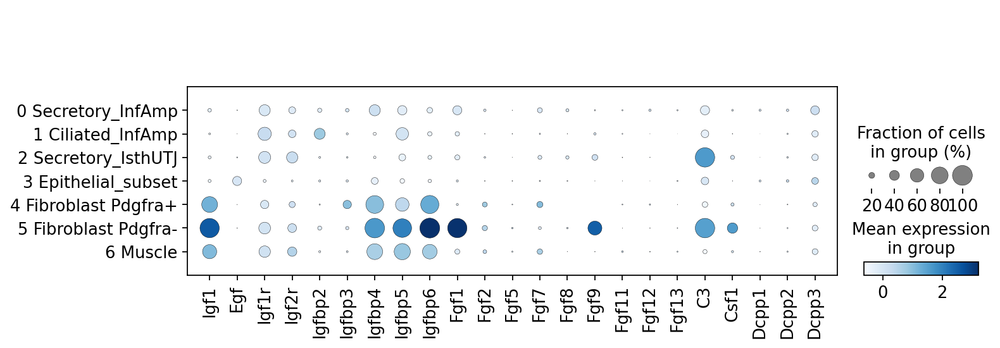

In [63]:
sc.pl.dotplot(Estrus_subset, ['Igf1', 'Egf', 'Igf1r', 'Igf2r', 'Igfbp2', 'Igfbp3', 'Igfbp4', 'Igfbp5', 'Igfbp6',
                              'Fgf1', 'Fgf2', 'Fgf5', 'Fgf7', 'Fgf8', 'Fgf9', 'Fgf11', 'Fgf12', 'Fgf13',
                              'C3', 'Csf1', 'Dcpp1', 'Dcpp2', 'Dcpp3'], groupby='leiden_anno', color_map='Blues',
             save='_Fig 5A.pdf')

In [64]:
Estrus_subset

AnnData object with n_obs × n_vars = 5156 × 17864
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'leiden_anno'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', "dendrogram_['leiden']", 'rank_genes_groups', 'dendrogram_leiden', 'leiden_anno_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

Saving bdata to results_file over-writing adata_subset.

In [65]:
Estrus_subset.write('./Estrus_subset_analyzed.h5ad')

To read the saved file use the following command.

In [66]:
Estrus_subset = sc.read('./Estrus_subset_analyzed.h5ad')